# Data visualisation

In [ ]:
# !pip install kneed

In [3]:
# IMPORTS
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

## Import data

In [24]:
# Set Seaborn style
sns.set(style="whitegrid")

# IMPORT DATA
pat_list = ['SARK012', 'SARK018', 'SARK019', 'SARK034', 'SARK017', 'SARK021', 'SARK025', 
            'SARK041', 'SARK011', 'SARK027', 'SARK029', 'SARK032', 'SARK033', 'SARK037', 'SARK052', 'SARK059']

# file_path = 'TCR_sequencing_all_samples_adjusted_20240508.xlsx' # OLD
file_path = 'TCR_seq_new.xlsx' # NEW


all_df = {}

# Load the Excel file for each patient
for i, pat in enumerate(pat_list):
    # Read
    sheet_index = 2*i
    tcr_df = pd.read_excel(file_path, sheet_name=sheet_index, engine='openpyxl')

    # Remove rows where 'CDR3.amino.acid.sequence' is NaN
    tcr_df = tcr_df.dropna(subset=['CDR3.amino.acid.sequence'])
    # tcr_df

    # Select columns containing 'Day' (time points)
    tcr_counts = tcr_df.filter(regex='Day').copy()

    # Convert all values to numeric (important for summing later)
    tcr_counts = tcr_counts.apply(pd.to_numeric, errors='coerce')

    # Replace missing values with a 0 if the freq data has a 0
    tcr_counts = tcr_counts.where(~(tcr_counts.isna()), 0)

    # Rename columns by extracting the numeric part and converting to integer
    tcr_counts.columns = [int(col.split(' ')[1]) for col in tcr_counts.columns]

    tcr_counts = tcr_counts.astype(float)

    tcr_counts["Total"] = tcr_counts.sum(axis=1)

    # Add an ID column - To later be able to identify the sequences if necessary
    tcr_counts['id'] = ['TCR_' + str(j + 1) for j in range(len(tcr_counts))]

    # Sort by counts of first col
    tcr_counts = tcr_counts.sort_values(by=tcr_counts.columns[0], ascending=False, kind="mergesort").reset_index(drop=True)
    # # tcr_counts = tcr_counts.sort_values(by=tcr_counts.columns[-2], ascending=False, kind="mergesort").reset_index(drop=True)

    # To check how many sequences we potentially are leaving out 
    print(f'\nFor {pat}:')
    print(f'    Number of seqs >0 on Day 0: {(tcr_counts.iloc[:, 0] > 0).sum()}')
    print(f'    Number of seqs >50 on Day 0: {(tcr_counts.iloc[:, 0] > 50).sum()}')
    print(f'    Number of seqs =0 on Day 0 BUT >50 on Total: {((tcr_counts.iloc[:, 0] == 0) & (tcr_counts.iloc[:, -2] > 50)).sum()}')

    # Keep top 100 ranked sequences (Constrained on max num of seg for pat SARK018 = 101)
    tcr_counts_100 = tcr_counts.copy().head(100)
    tcr_ids = tcr_counts_100["id"].tolist()
    print(f'    Top 100 seqs: {tcr_ids}')

    # Melt the dataframe for plotting (id, time, counts)
    tcr_counts_m = tcr_counts_100.drop(columns=["Total"]).melt(id_vars='id', var_name='time', value_name='counts').copy()

    # Store in dictionary
    all_df[pat] = tcr_counts_m



For SARK012:
    Number of seqs >0 on Day 0: 87
    Number of seqs >50 on Day 0: 1
    Number of seqs =0 on Day 0 BUT >50 on Total: 0
    Top 100 seqs: ['TCR_4', 'TCR_1', 'TCR_2', 'TCR_10', 'TCR_3', 'TCR_8', 'TCR_5', 'TCR_13', 'TCR_16', 'TCR_6', 'TCR_9', 'TCR_7', 'TCR_17', 'TCR_57', 'TCR_25', 'TCR_11', 'TCR_79', 'TCR_83', 'TCR_85', 'TCR_86', 'TCR_87', 'TCR_88', 'TCR_89', 'TCR_90', 'TCR_91', 'TCR_92', 'TCR_12', 'TCR_19', 'TCR_33', 'TCR_46', 'TCR_52', 'TCR_70', 'TCR_74', 'TCR_93', 'TCR_94', 'TCR_95', 'TCR_96', 'TCR_97', 'TCR_98', 'TCR_15', 'TCR_29', 'TCR_34', 'TCR_37', 'TCR_54', 'TCR_62', 'TCR_65', 'TCR_68', 'TCR_78', 'TCR_81', 'TCR_82', 'TCR_99', 'TCR_100', 'TCR_101', 'TCR_102', 'TCR_103', 'TCR_104', 'TCR_105', 'TCR_106', 'TCR_107', 'TCR_108', 'TCR_109', 'TCR_110', 'TCR_111', 'TCR_112', 'TCR_113', 'TCR_114', 'TCR_115', 'TCR_116', 'TCR_117', 'TCR_118', 'TCR_119', 'TCR_120', 'TCR_121', 'TCR_122', 'TCR_123', 'TCR_124', 'TCR_125', 'TCR_126', 'TCR_127', 'TCR_128', 'TCR_129', 'TCR_130', 'TCR

In [25]:
all_df['SARK012'].head(100)

,id,time,counts
0,TCR_4,0,81.0
1,TCR_1,0,34.0
2,TCR_2,0,34.0
3,TCR_10,0,18.0
4,TCR_3,0,16.0
...,...,...,...
95,TCR_27,0,0.0
96,TCR_28,0,0.0
97,TCR_30,0,0.0
98,TCR_31,0,0.0


## Line plots

### Linear

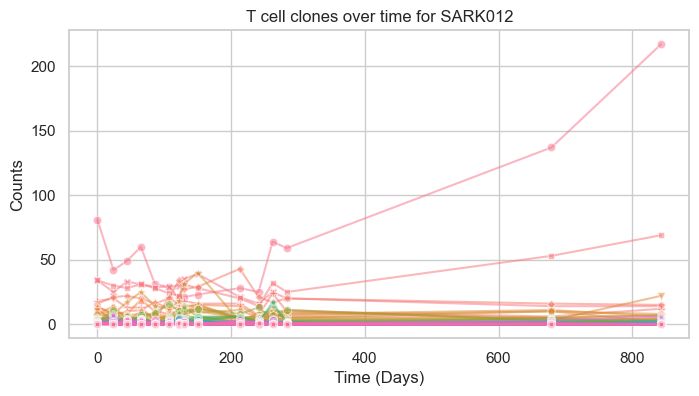

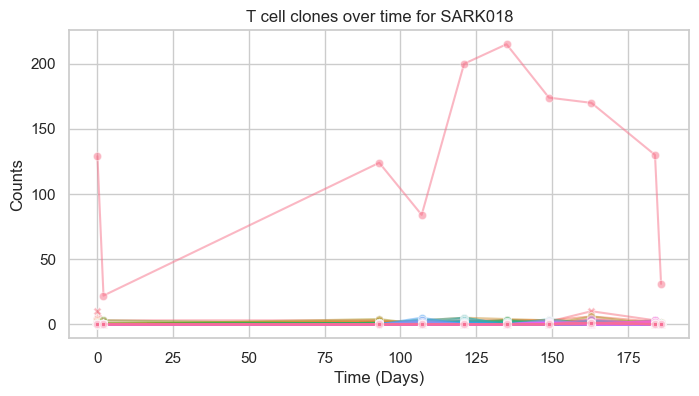

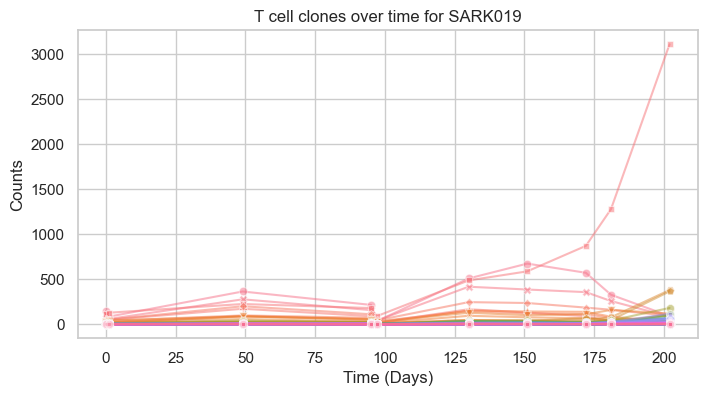

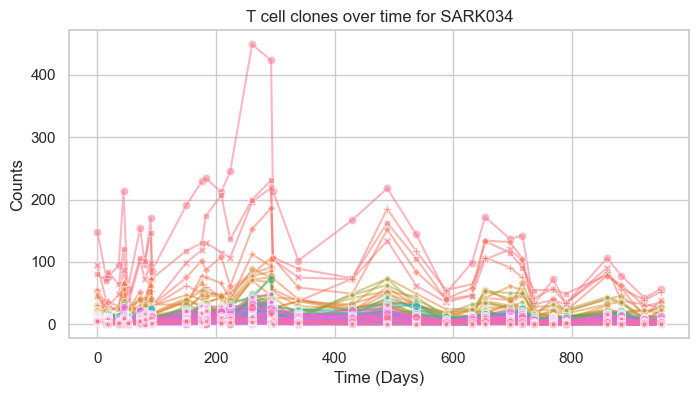

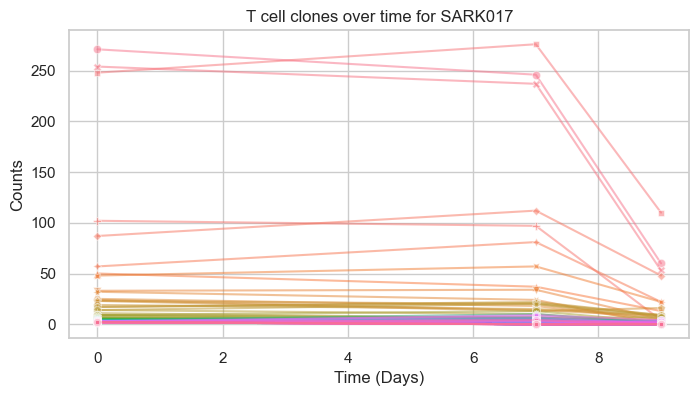

...

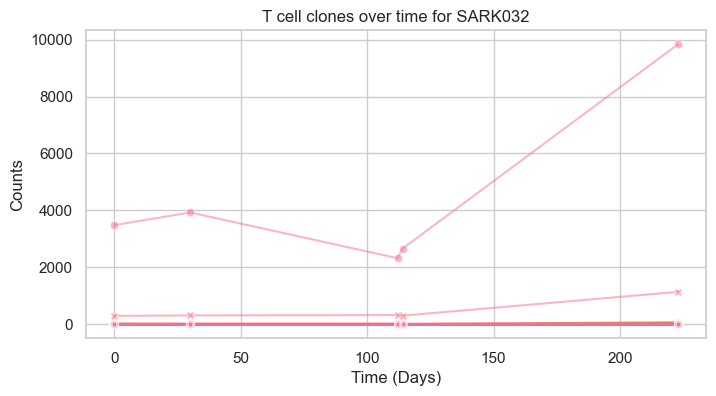

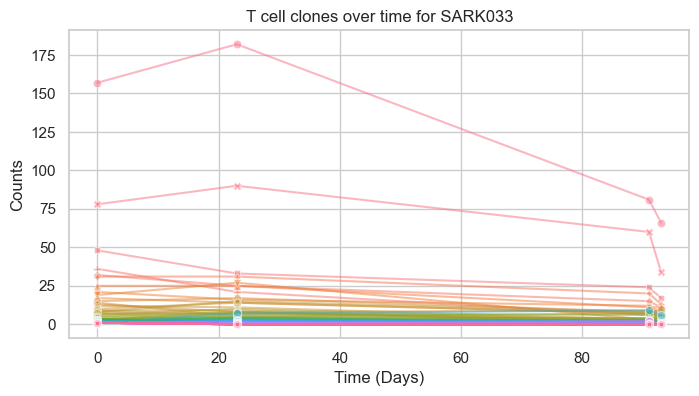

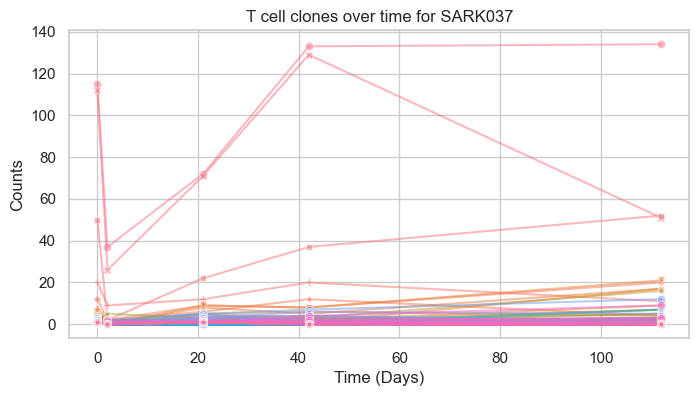

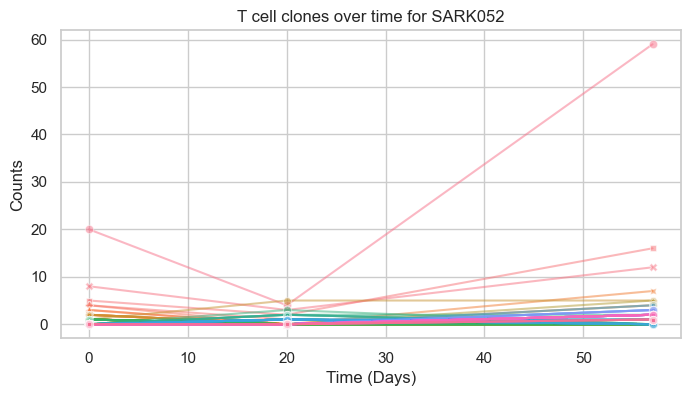

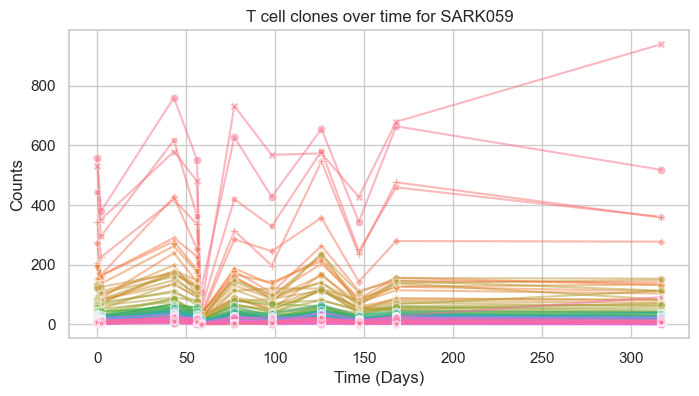

In [27]:
# Set Seaborn style
sns.set(style="whitegrid")

for pat, df in all_df.items():
    # Plot: Line Plot without empty time steps
    plt.figure(figsize=(8, 4))
    sns.lineplot(data=df, x='time', y='counts', hue='id', style='id', markers=True, dashes=False, alpha=0.5)
    plt.xlabel('Time (Days)')
    plt.ylabel('Counts')
    plt.xticks()
    plt.title(f'T cell clones over time for {pat}')
    plt.legend().remove()  # Prevent legend clutter
    plt.show()


### Y log

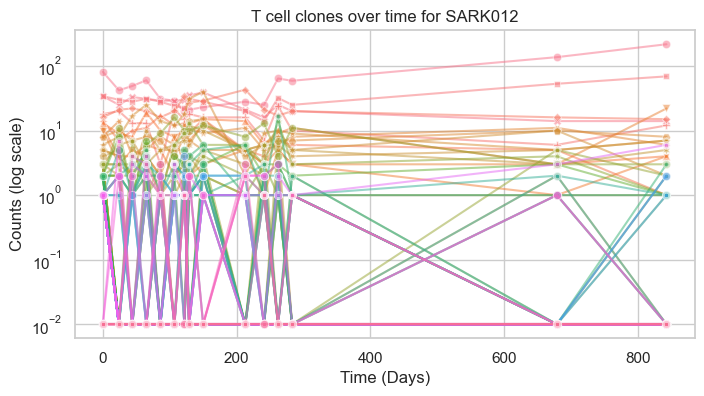

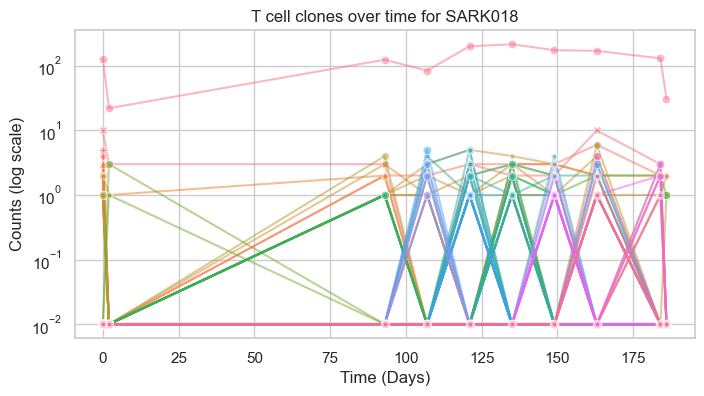

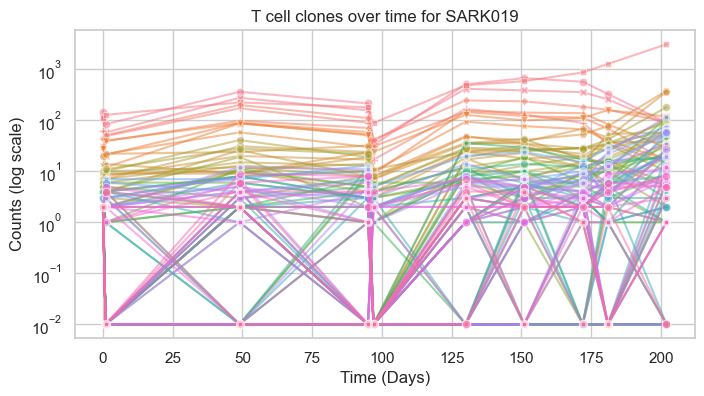

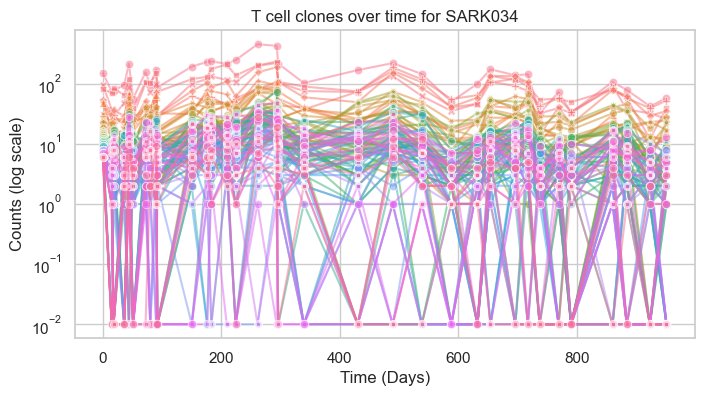

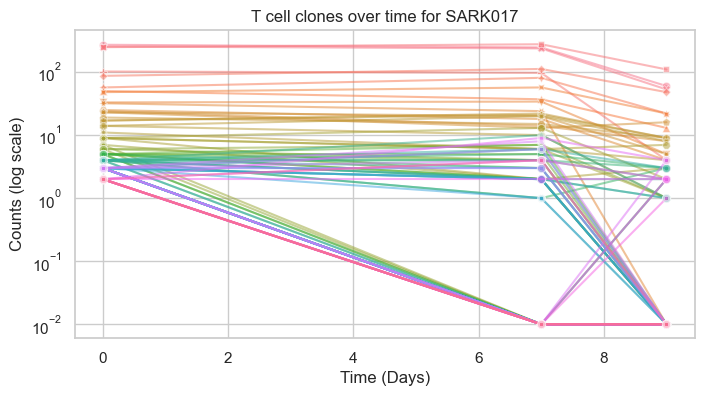

...

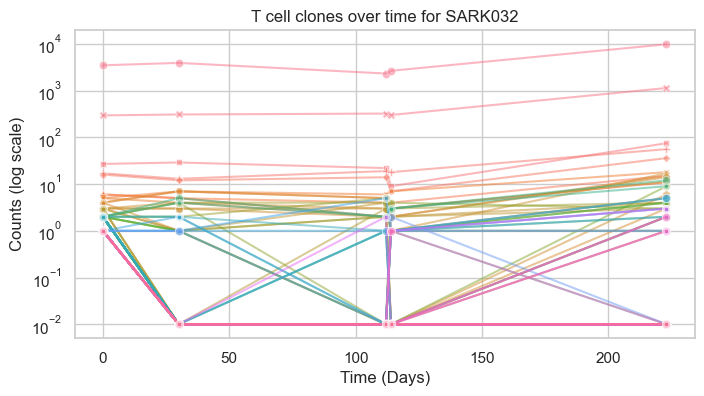

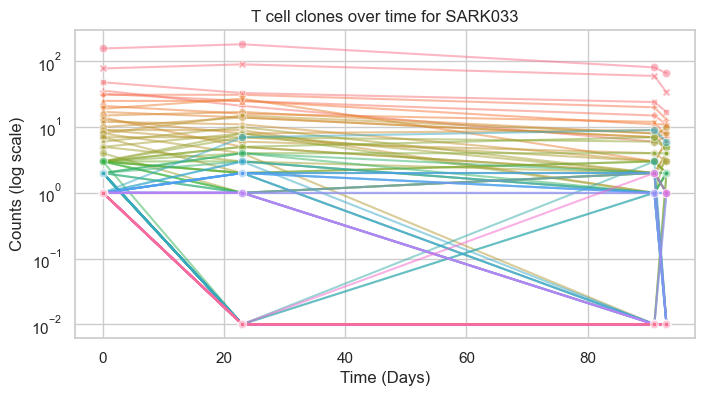

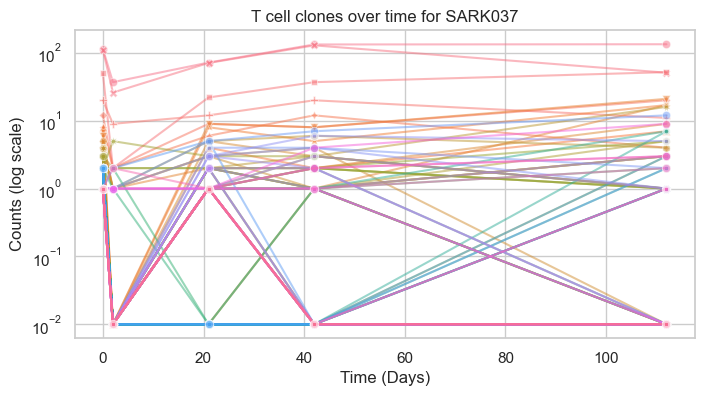

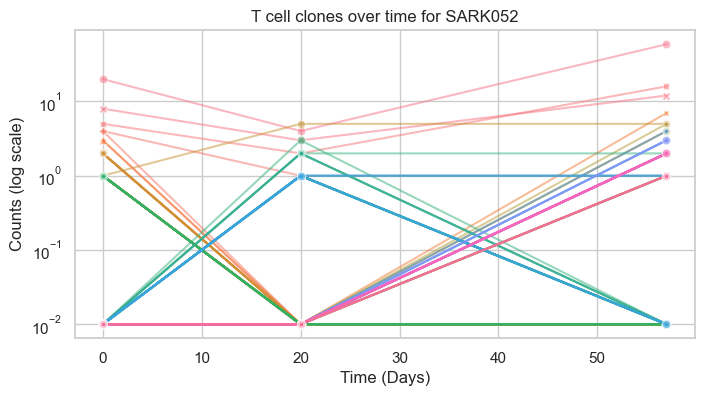

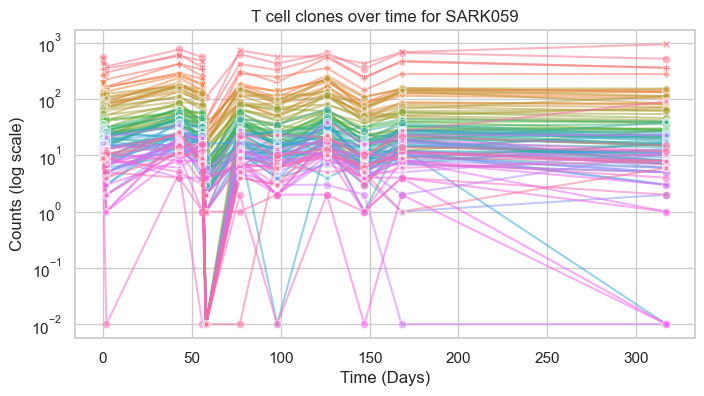

In [31]:
# Set Seaborn style
sns.set(style="whitegrid")

for pat, df in all_df.items():
    # Plot: Line Plot without empty time steps
    plt.figure(figsize=(8, 4))

    # Prepare Data for Log Plot: Replace 0s with a small value
    df_log = df.copy()
    df_log["counts"] = df_log["counts"].replace(0, 1e-2)  # Replace zeros with a small value (e.g., 0.01)

    sns.lineplot(data=df_log, x='time', y='counts', hue='id', style='id', markers=True, dashes=False, alpha=0.5)
    
    # Set log scale for y-axis
    plt.yscale('log')  
    
    plt.xlabel('Time (Days)')
    plt.ylabel('Counts (log scale)')  # Update label to reflect log scale
    plt.xticks()
    plt.title(f'T cell clones over time for {pat}')
    plt.legend().remove()  # Prevent legend clutter
    plt.show()


### Both

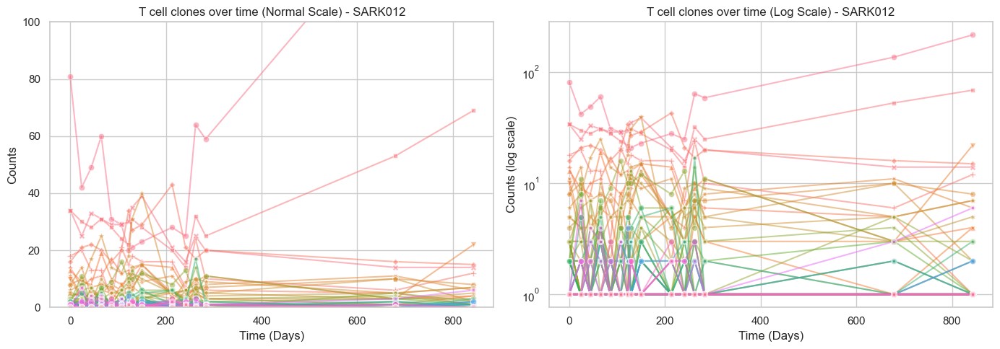

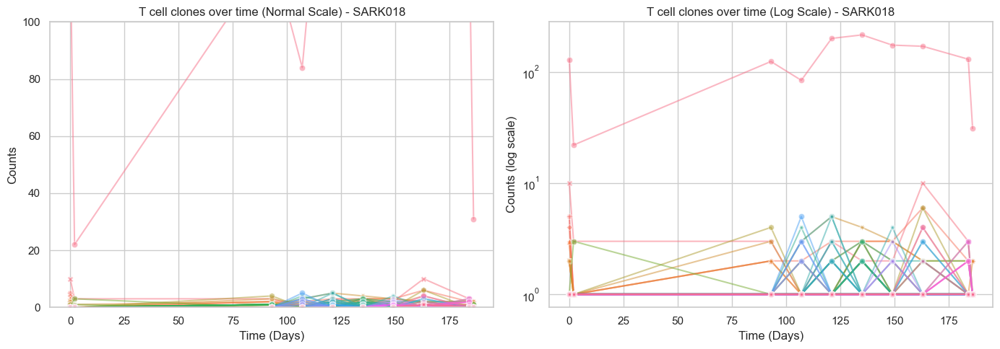

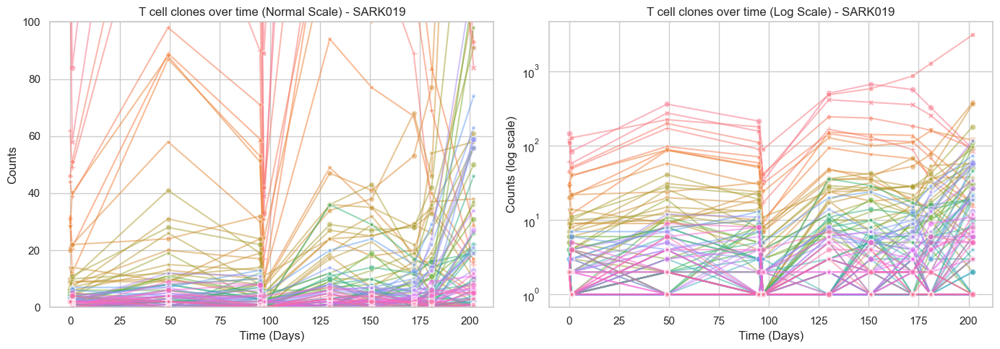

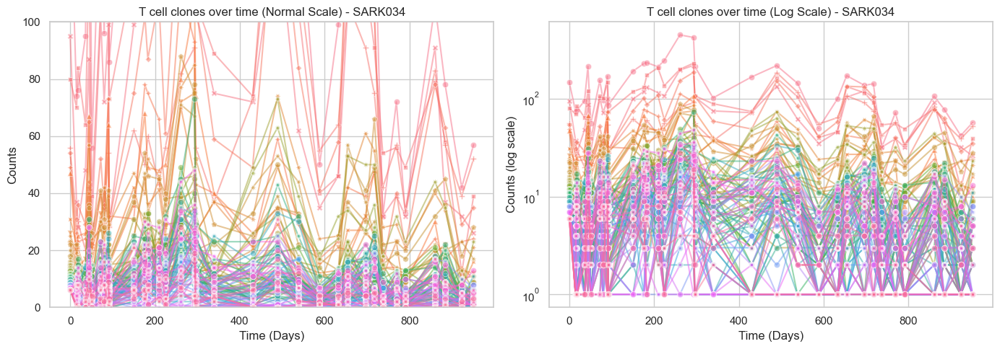

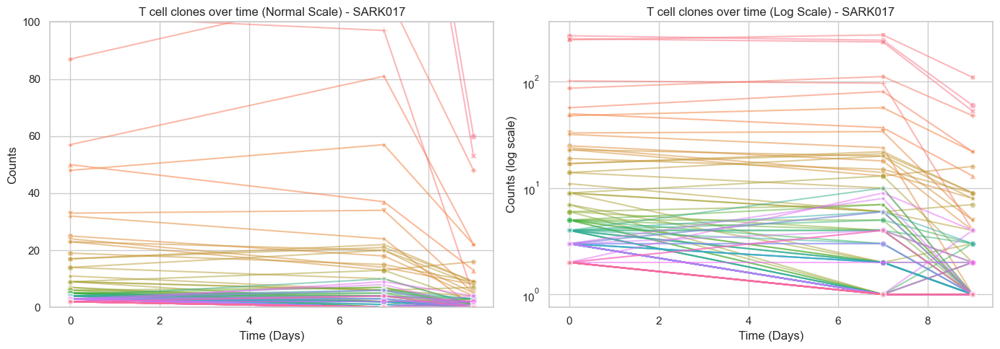

...

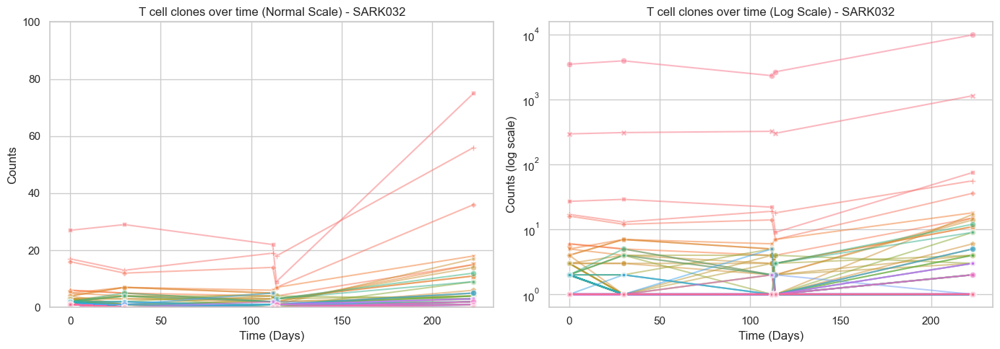

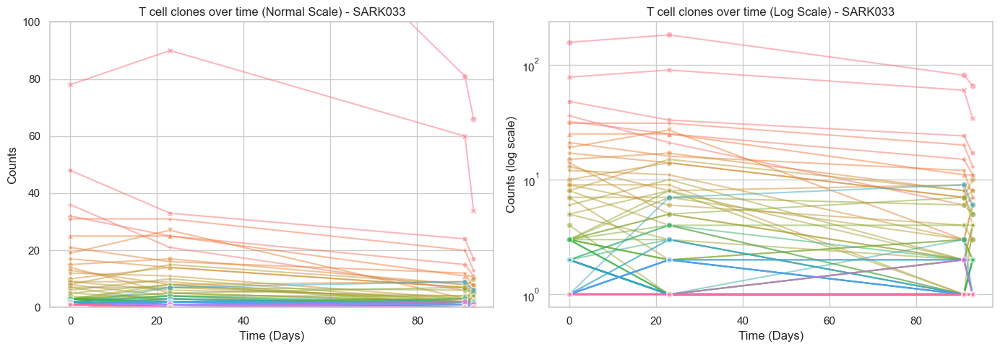

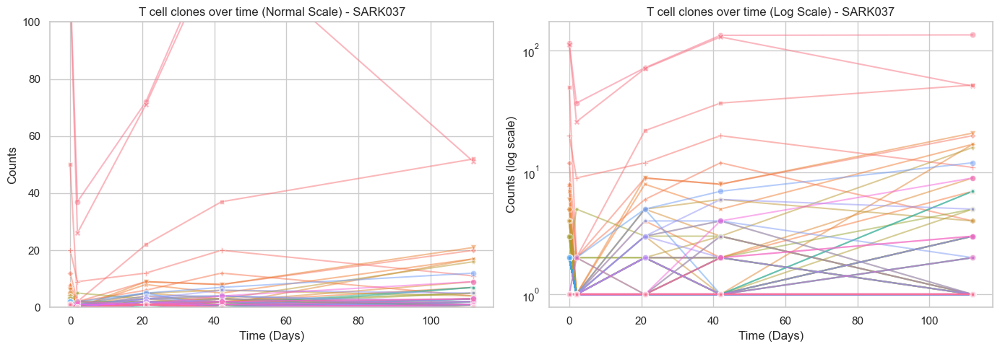

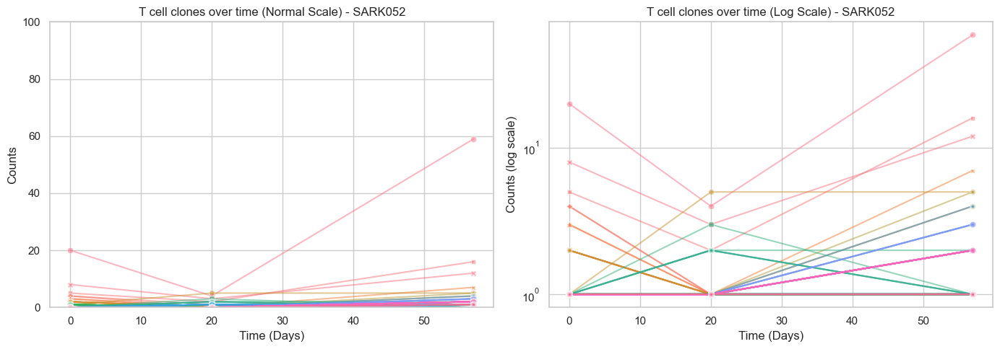

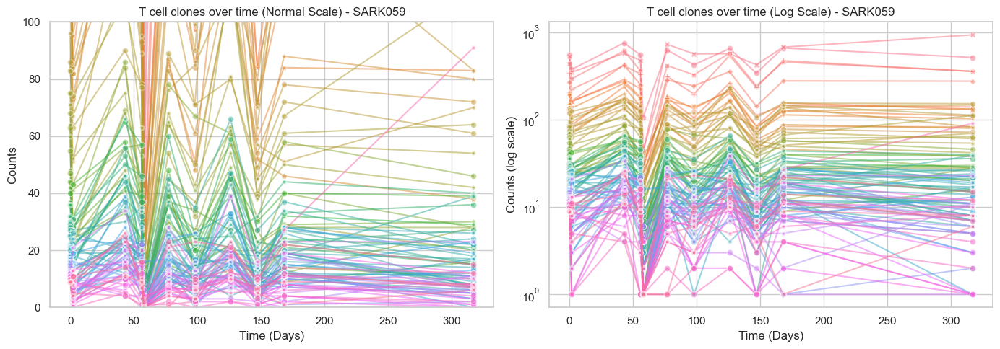

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Set Seaborn style
sns.set(style="whitegrid")

for pat, df in all_df.items():
    # Create figure and subplots
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))  # 1 row, 2 columns
    
    # Plot 1: Normal Y-Axis (Left)
    sns.lineplot(data=df, x='time', y='counts', hue='id', style='id', markers=True, dashes=False, alpha=0.5, ax=axes[0])
    axes[0].set_xlabel('Time (Days)')
    axes[0].set_ylabel('Counts')
    axes[0].set_title(f'T cell clones over time (Normal Scale) - {pat}')
    axes[0].set_ylim(0, 100)
    axes[0].legend().remove()  # Prevent legend clutter
    
    # Prepare Data for Log Plot: Replace 0s with a small value
    df_log = df.copy()
    df_log["counts"] = df_log["counts"].replace(0, 1)  # Replace zeros with a small value (e.g., 0.01)

    # Plot 2: Log Y-Axis (Right)
    sns.lineplot(data=df_log, x='time', y='counts', hue='id', style='id', markers=True, dashes=False, alpha=0.5, ax=axes[1])
    axes[1].set_yscale('log')  # Log scale for y-axis
    axes[1].set_xlabel('Time (Days)')
    axes[1].set_ylabel('Counts (log scale)')
    axes[1].set_title(f'T cell clones over time (Log Scale) - {pat}')
    axes[1].legend().remove()  # Prevent legend clutter

    # Show the plots
    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()


## Histogram

### Your typical histogram

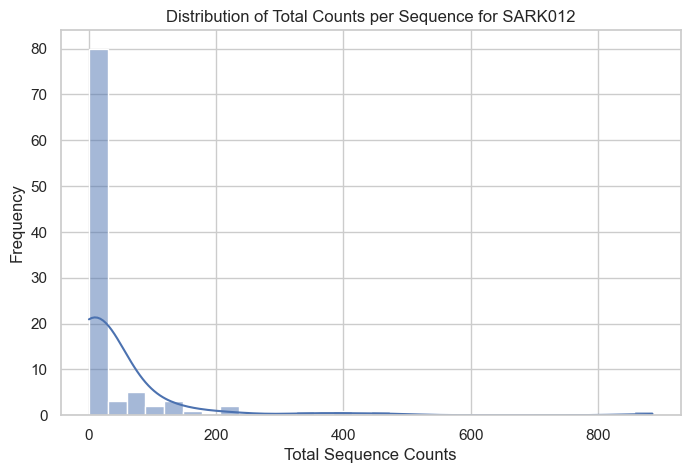

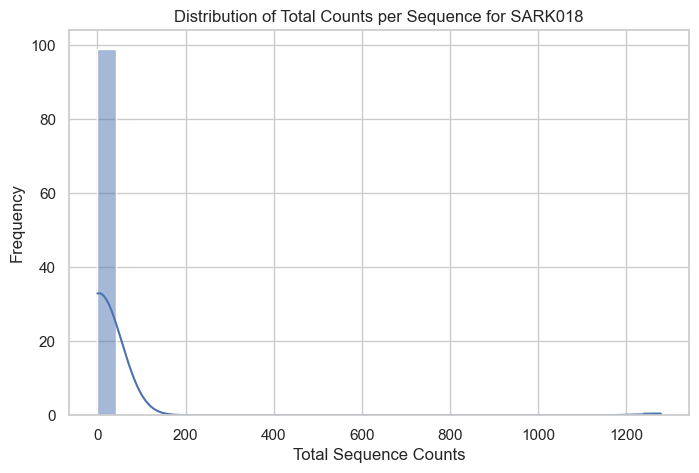

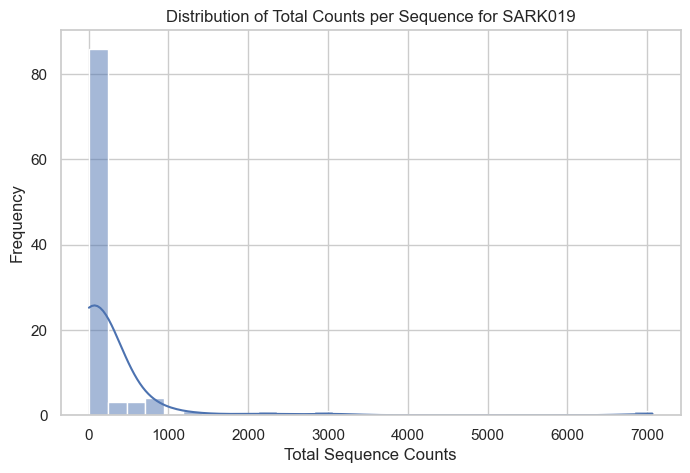

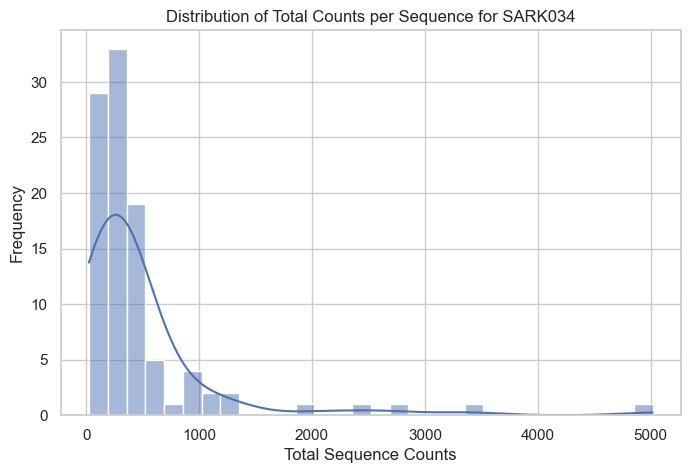

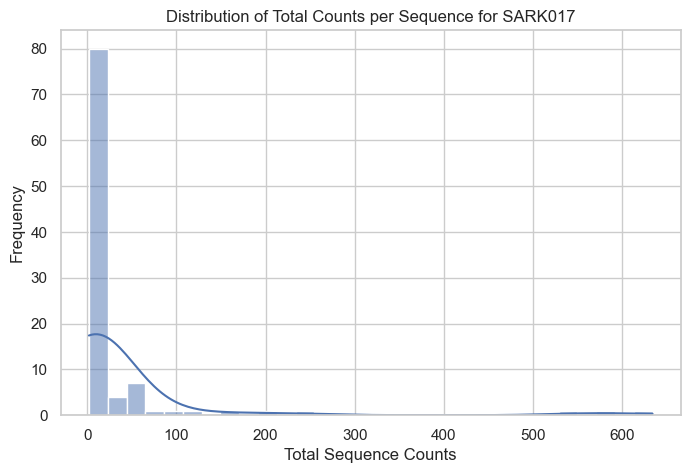

...

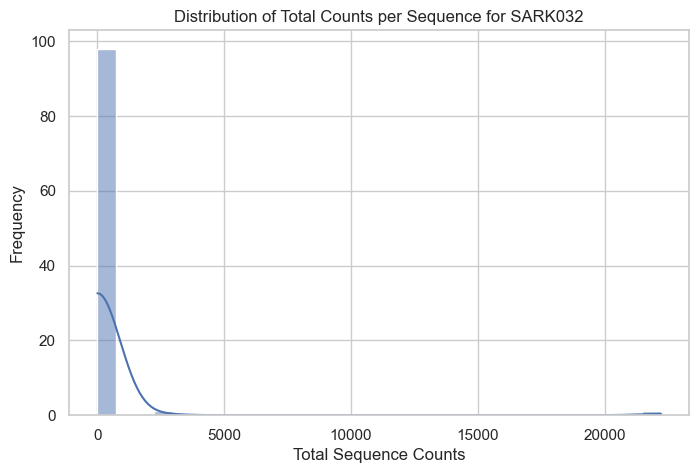

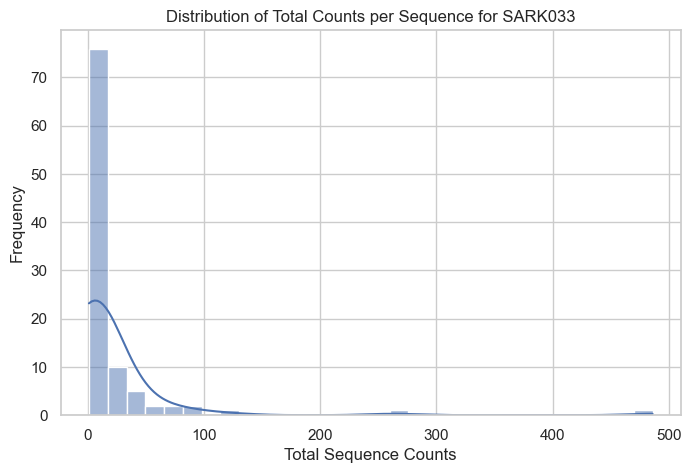

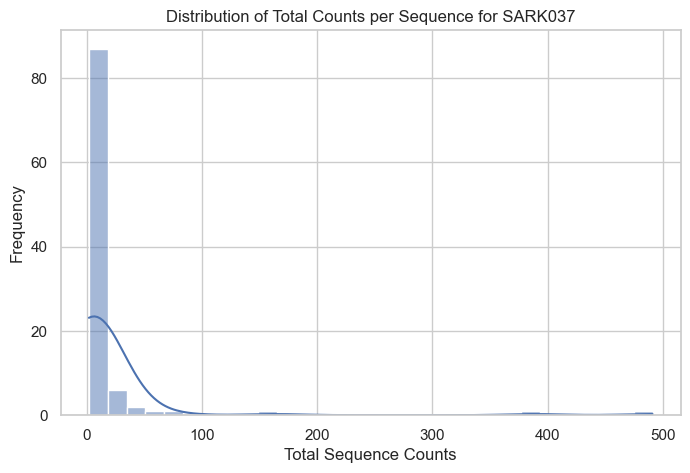

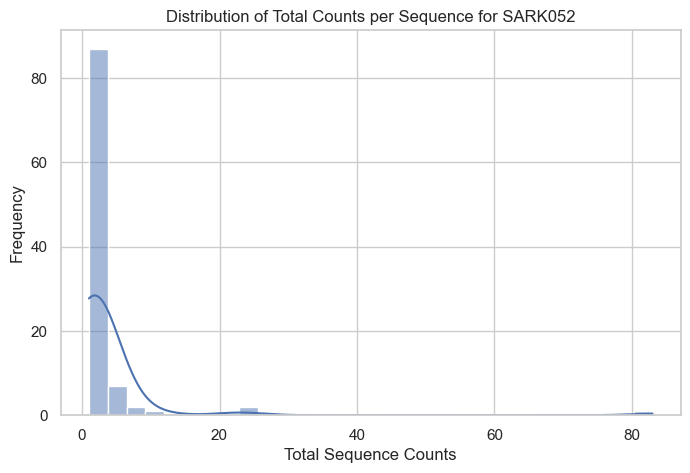

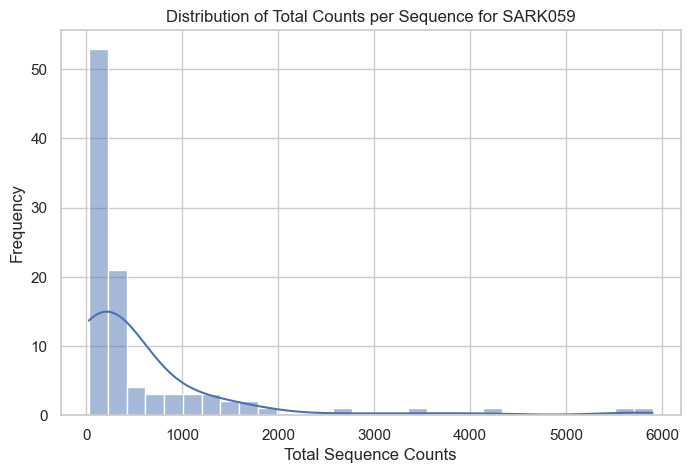

In [34]:
# Plot 2: Histograms
for pat, df in all_df.items():
    if df.empty:
        print(f"Skipping {pat} due to empty dataframe.")
        continue

    # Sum only the 'counts' column grouped by 'id'
    sequence_totals = df.groupby('id')['counts'].sum()

    # Histogram
    plt.figure(figsize=(8, 5))
    sns.histplot(sequence_totals, bins=30, kde=True)
    plt.xlabel("Total Sequence Counts")
    plt.ylabel("Frequency")
    plt.title(f'Distribution of Total Counts per Sequence for {pat}')
    plt.show()


### Log scale Hist

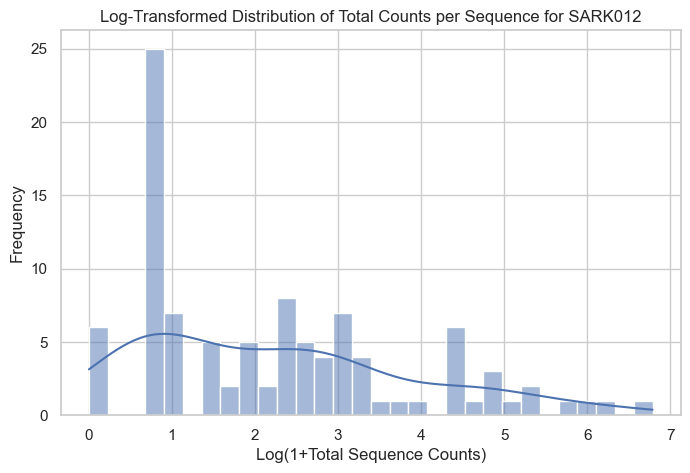

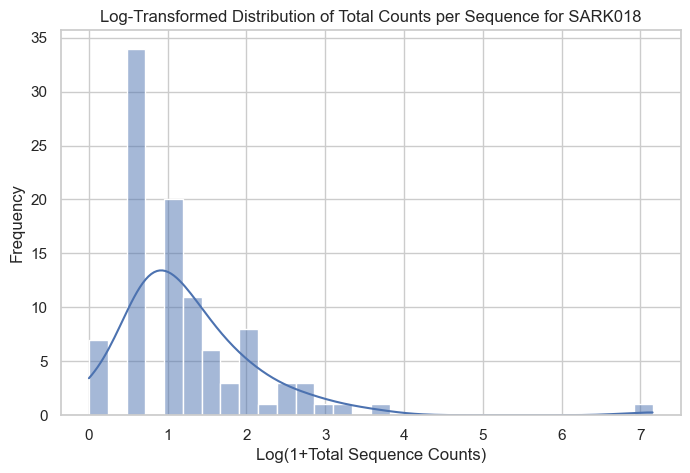

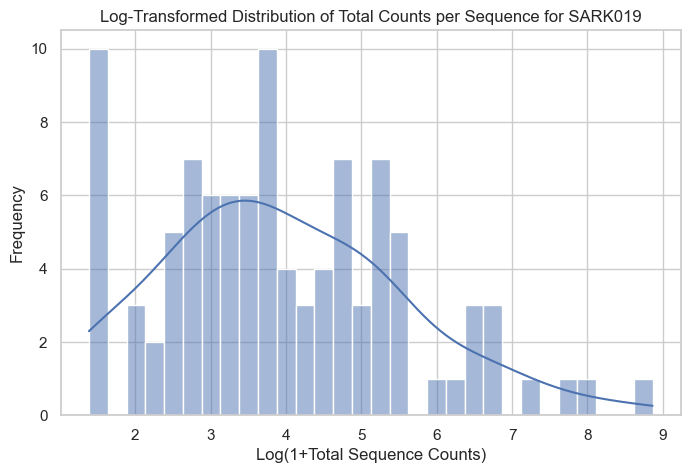

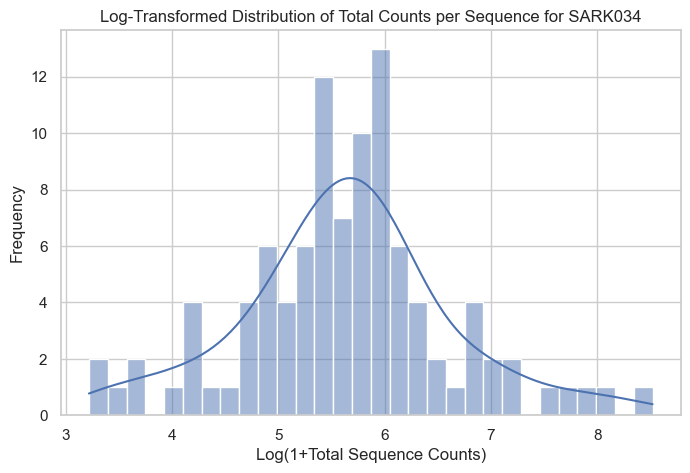

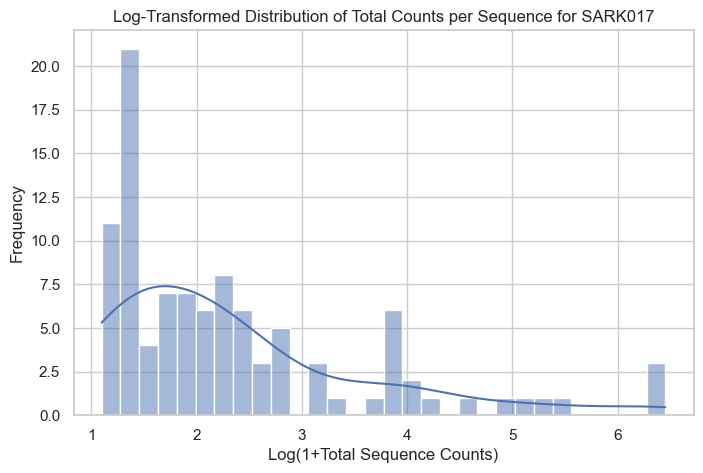

...

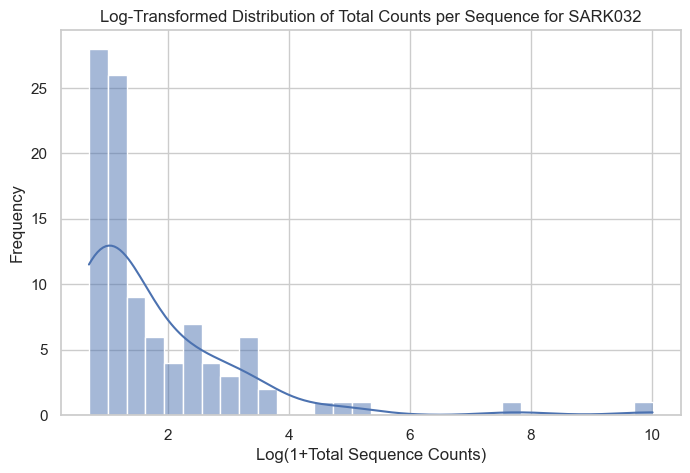

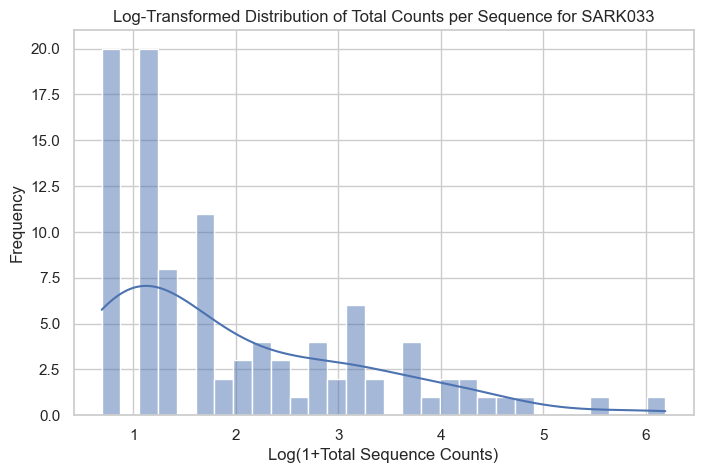

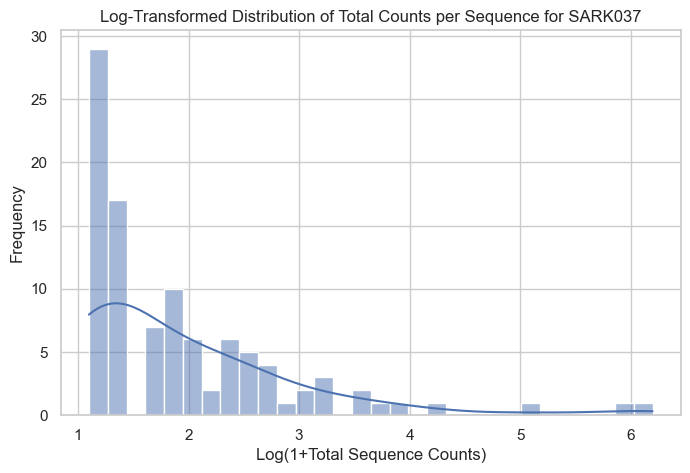

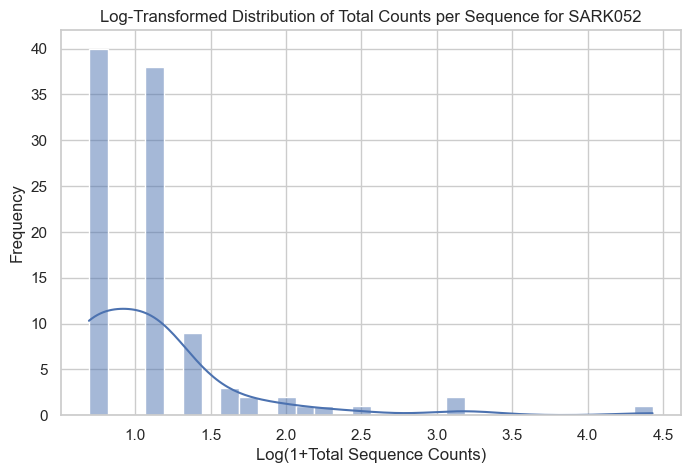

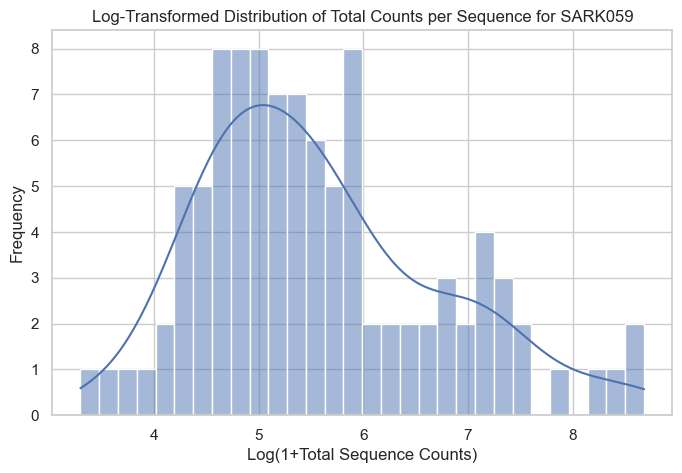

In [35]:
# Plot 3: Log-scale Histograms
for pat, df in all_df.items():
    if df.empty:
        print(f"Skipping {pat} due to empty dataframe.")
        continue

    # Sum only the 'counts' column grouped by 'id'
    sequence_totals = df.groupby('id')['counts'].sum()

    # Histogram
    plt.figure(figsize=(8, 5))
    sns.histplot(np.log1p(sequence_totals), bins=30, kde=True)
    plt.xlabel("Log(1+Total Sequence Counts)")
    plt.ylabel("Frequency")
    plt.title(f'Log-Transformed Distribution of Total Counts per Sequence for {pat}')
    plt.show()


## Boxplot

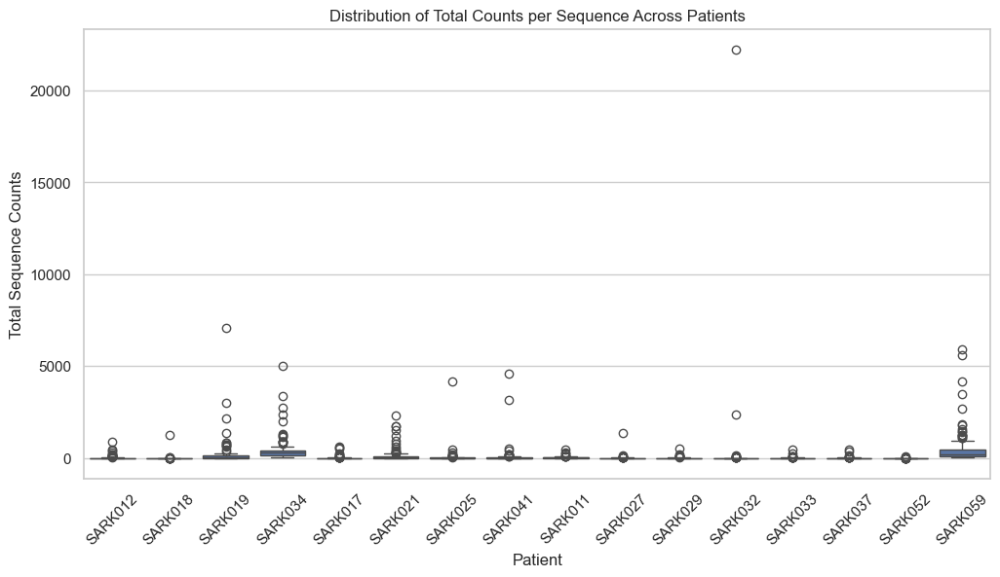

In [40]:
# Combine data across all patients
boxplot_data = []

for pat, df in all_df.items():
    if df.empty:
        print(f"Skipping {pat} due to empty dataframe.")
        continue

    sequence_totals = df.groupby('id')['counts'].sum()
    for value in sequence_totals:
        boxplot_data.append({'Patient': pat, 'Total Counts': value})

# Convert to DataFrame for Seaborn
boxplot_df = pd.DataFrame(boxplot_data)

# Boxplot with patients as categories
plt.figure(figsize=(12, 6))
sns.boxplot(x='Patient', y='Total Counts', data=boxplot_df)
plt.xticks(rotation=45)  # Rotate patient labels for readability
plt.xlabel("Patient")
plt.ylabel("Total Sequence Counts")
plt.title("Distribution of Total Counts per Sequence Across Patients")
plt.show()


C:\Users\viola\AppData\Local\Temp\ipykernel_2304\2235224760.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back and format with commas


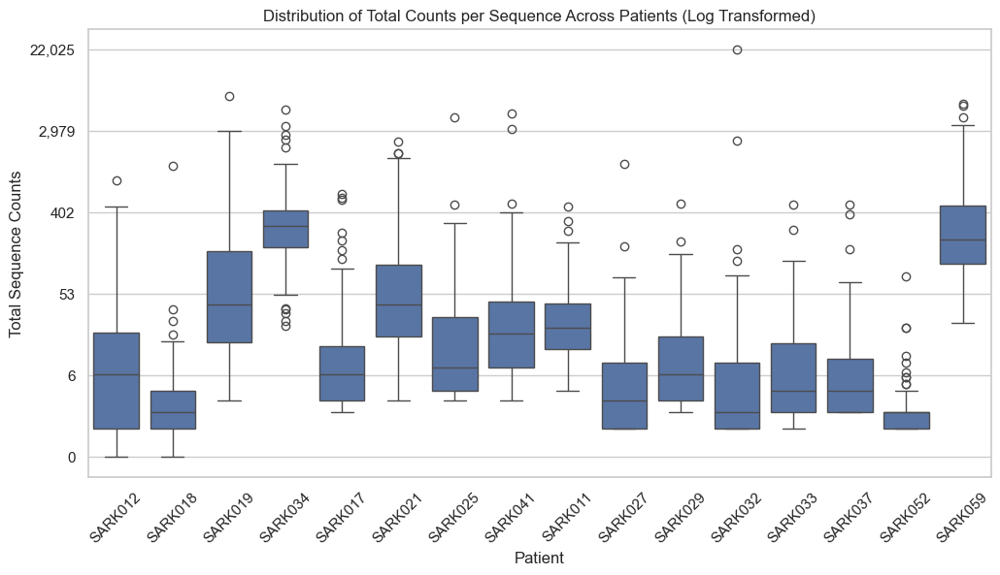

In [41]:
# Convert 'Total Counts' to log scale
boxplot_df['Log Total Counts'] = np.log1p(boxplot_df['Total Counts'])

# Create the plot
plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='Patient', y='Log Total Counts', data=boxplot_df)

# Convert y-axis ticks back to original scale
yticks = ax.get_yticks()
ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back and format with commas

# Formatting
plt.xticks(rotation=45)  # Rotate x-axis labels for readability
plt.xlabel("Patient")
plt.ylabel("Total Sequence Counts")
plt.title("Distribution of Total Counts per Sequence Across Patients (Log Transformed)")

plt.show()

### Each pat

C:\Users\viola\AppData\Local\Temp\ipykernel_2304\3073029521.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale


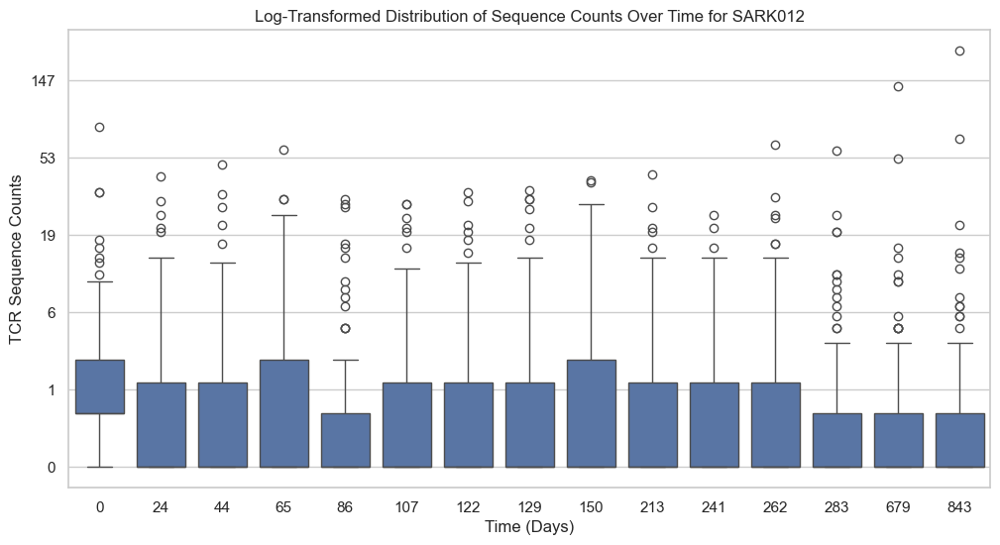

C:\Users\viola\AppData\Local\Temp\ipykernel_2304\3073029521.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale


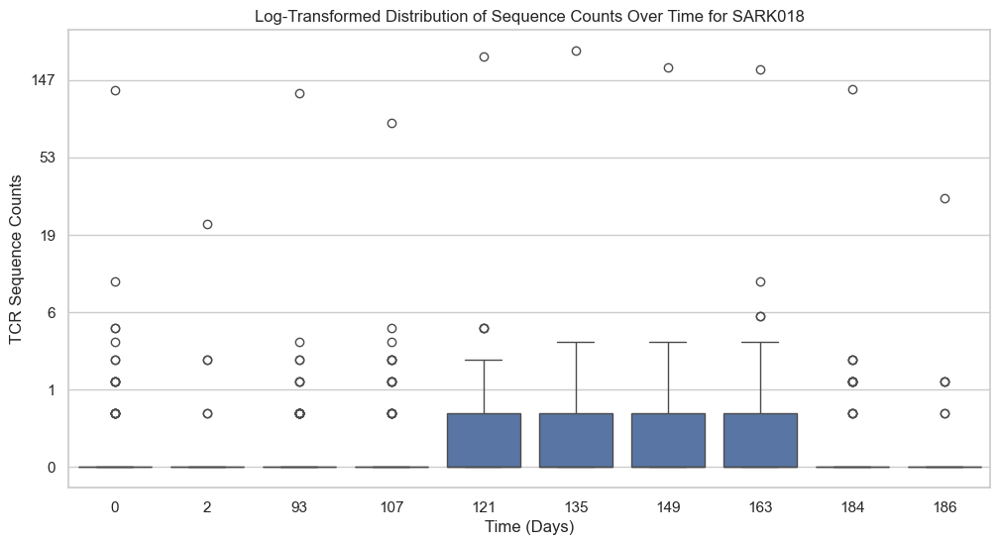

C:\Users\viola\AppData\Local\Temp\ipykernel_2304\3073029521.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale


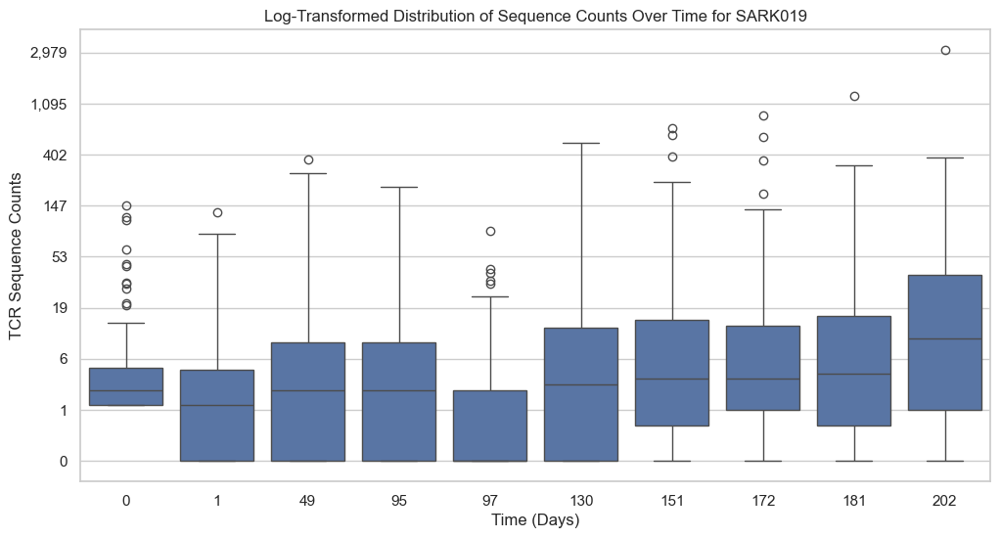

C:\Users\viola\AppData\Local\Temp\ipykernel_2304\3073029521.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale


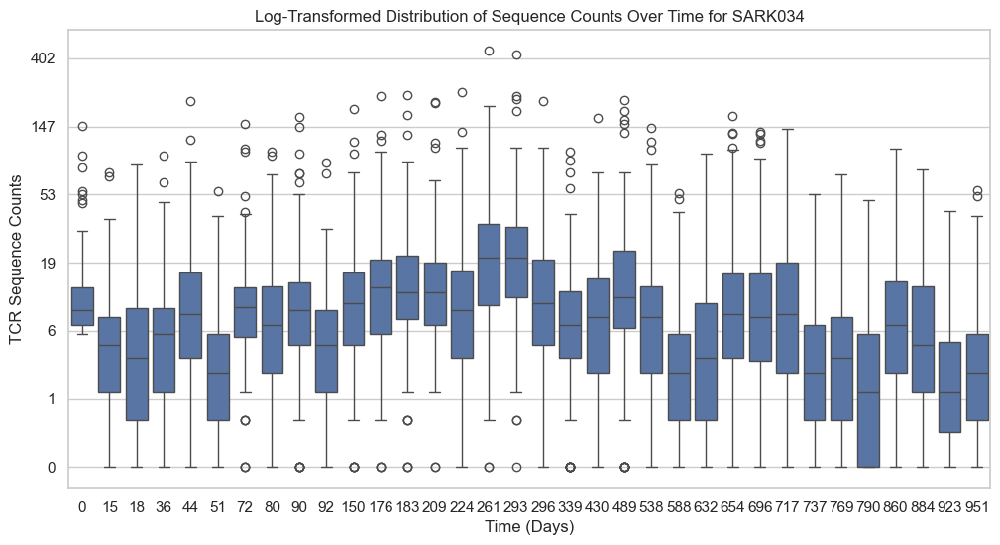

C:\Users\viola\AppData\Local\Temp\ipykernel_2304\3073029521.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale


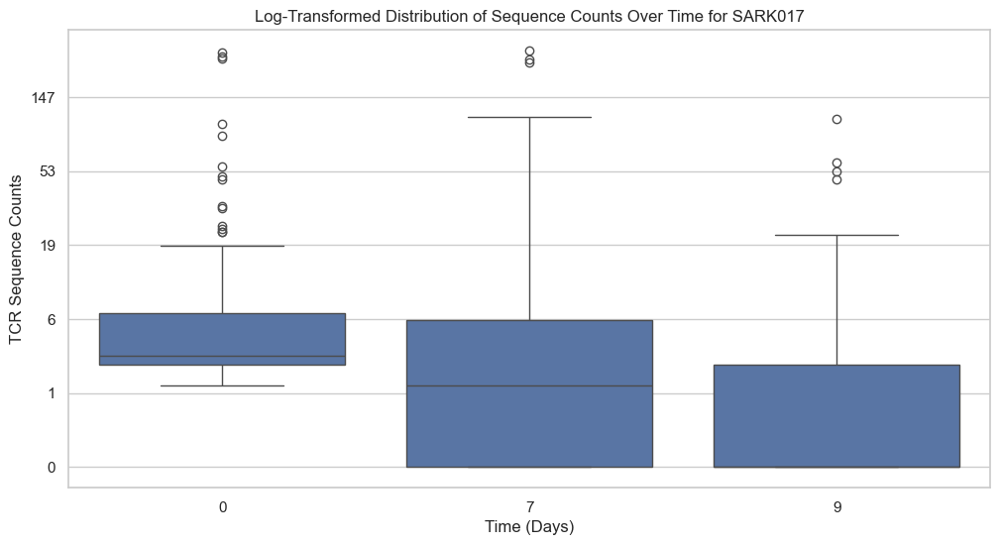

C:\Users\viola\AppData\Local\Temp\ipykernel_2304\3073029521.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale


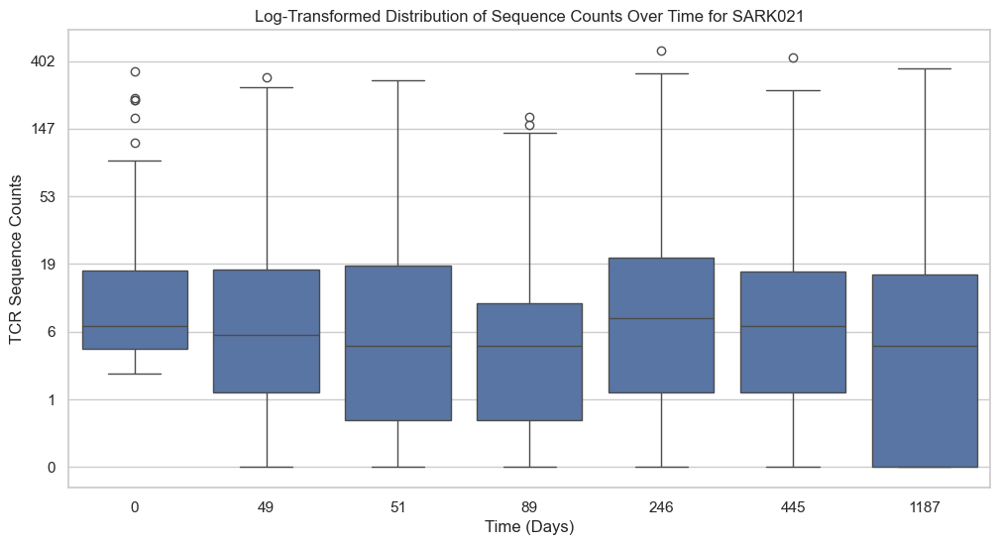

C:\Users\viola\AppData\Local\Temp\ipykernel_2304\3073029521.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale


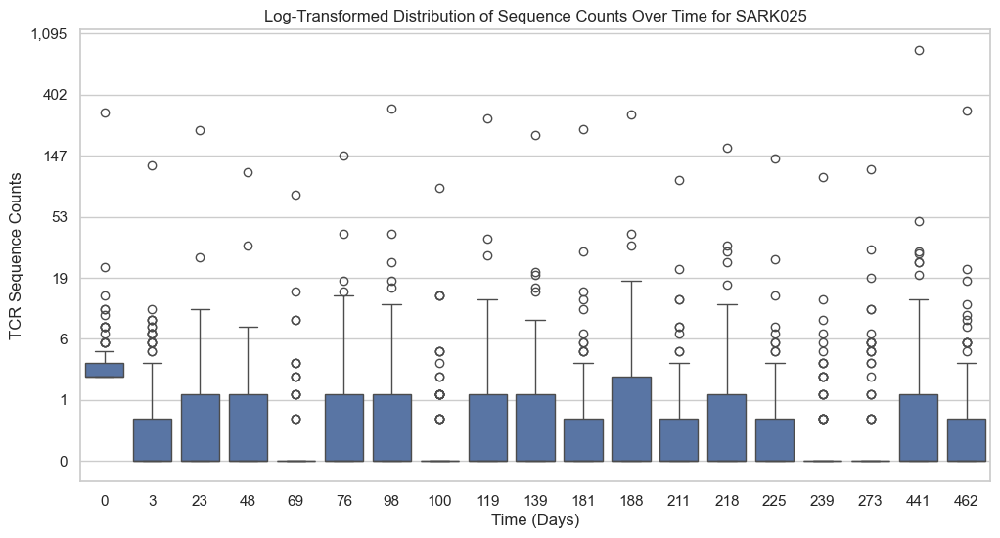

C:\Users\viola\AppData\Local\Temp\ipykernel_2304\3073029521.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale


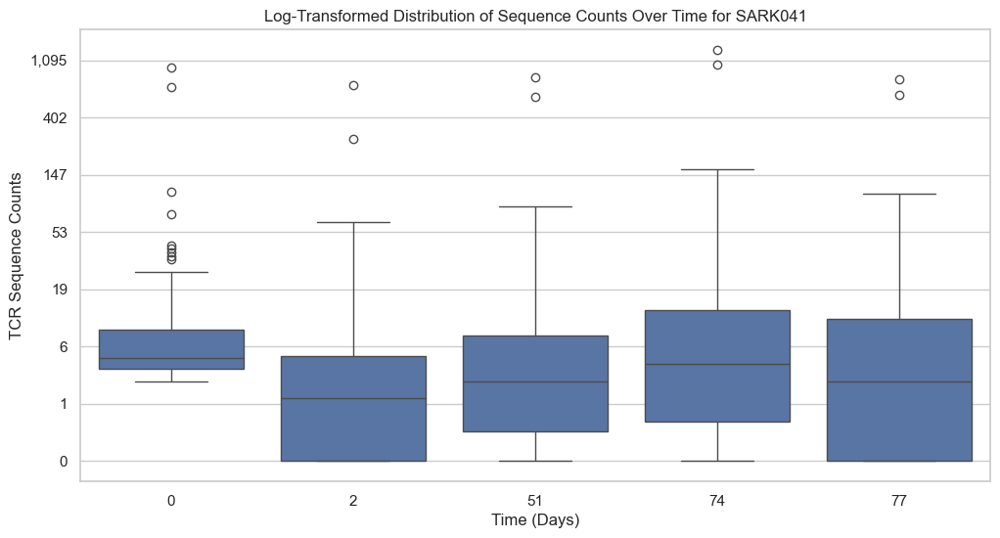

C:\Users\viola\AppData\Local\Temp\ipykernel_2304\3073029521.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale


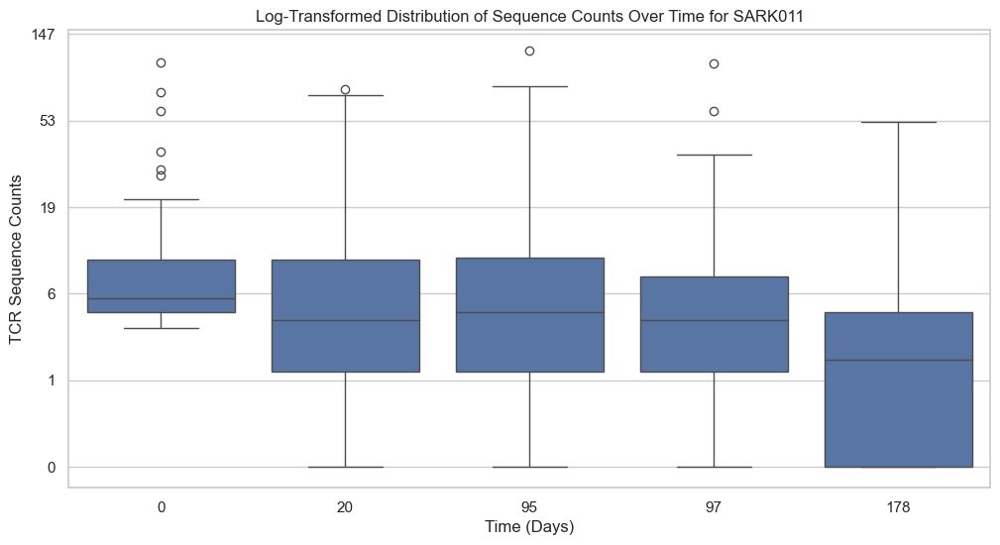

C:\Users\viola\AppData\Local\Temp\ipykernel_2304\3073029521.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale


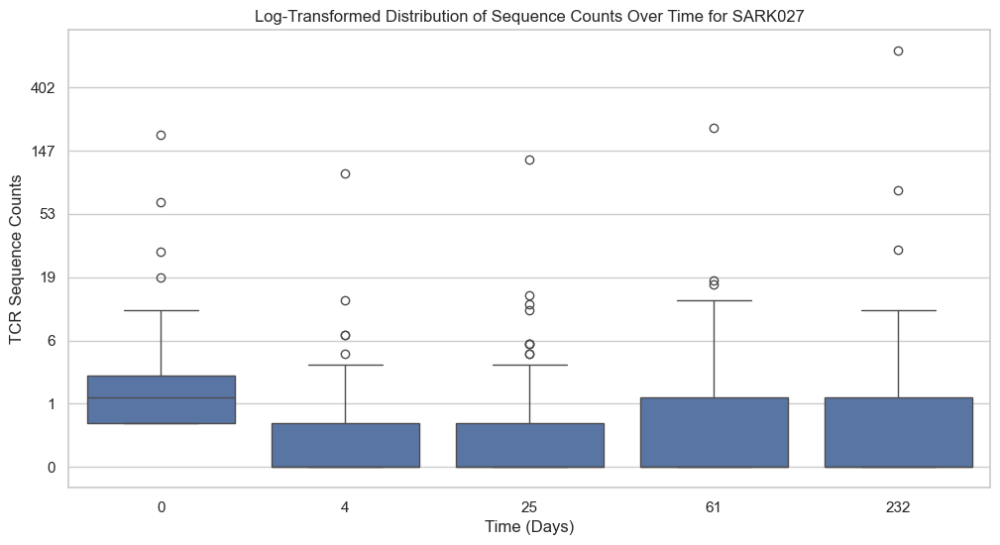

C:\Users\viola\AppData\Local\Temp\ipykernel_2304\3073029521.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale


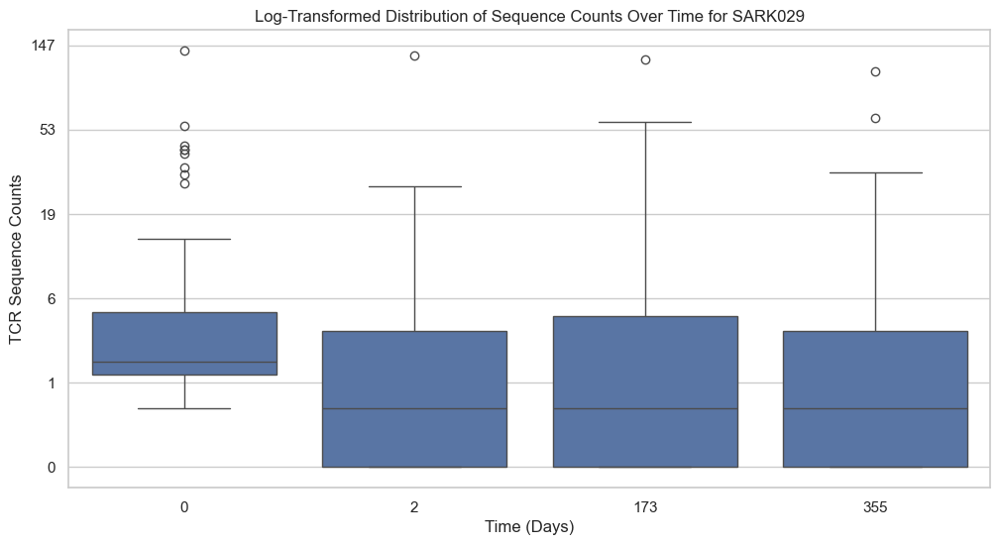

C:\Users\viola\AppData\Local\Temp\ipykernel_2304\3073029521.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale


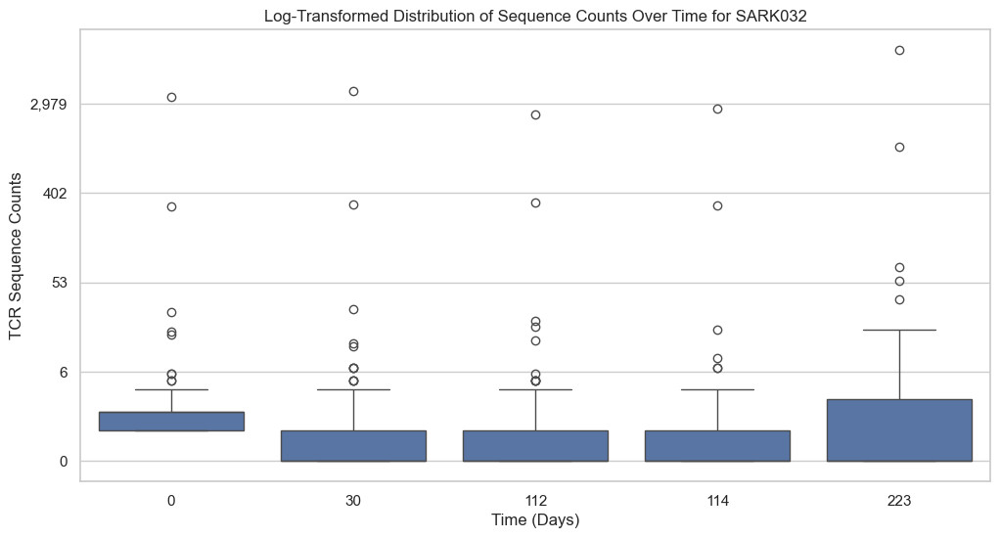

C:\Users\viola\AppData\Local\Temp\ipykernel_2304\3073029521.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale


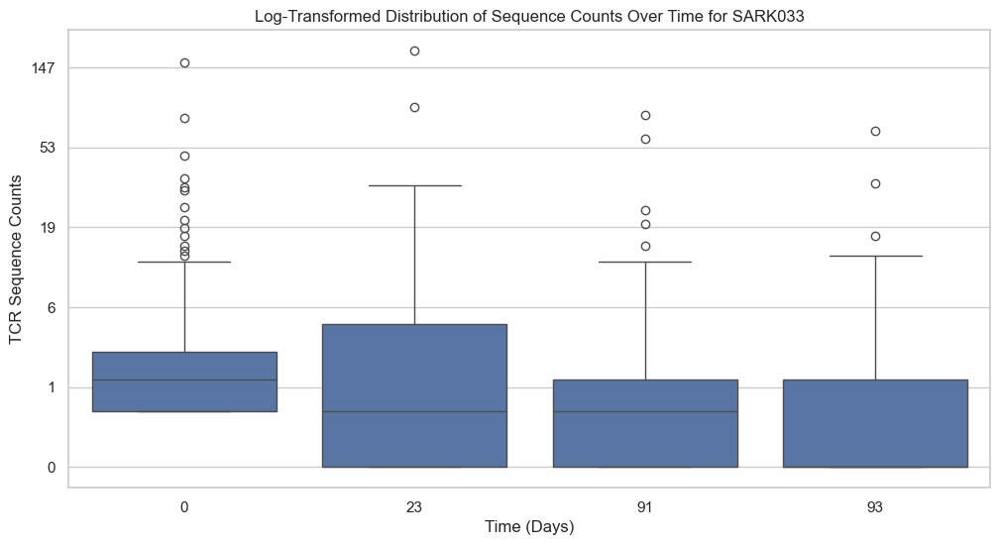

C:\Users\viola\AppData\Local\Temp\ipykernel_2304\3073029521.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale


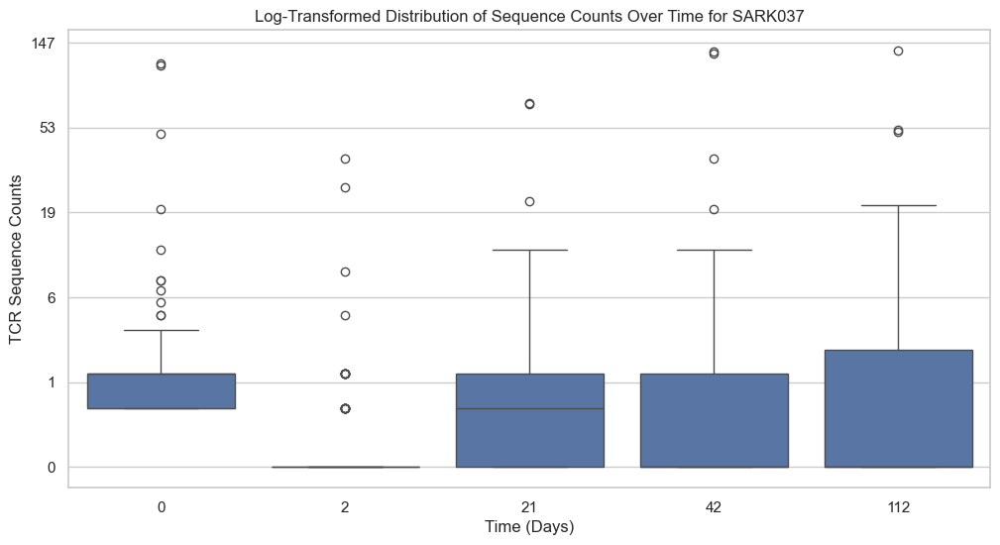

C:\Users\viola\AppData\Local\Temp\ipykernel_2304\3073029521.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale


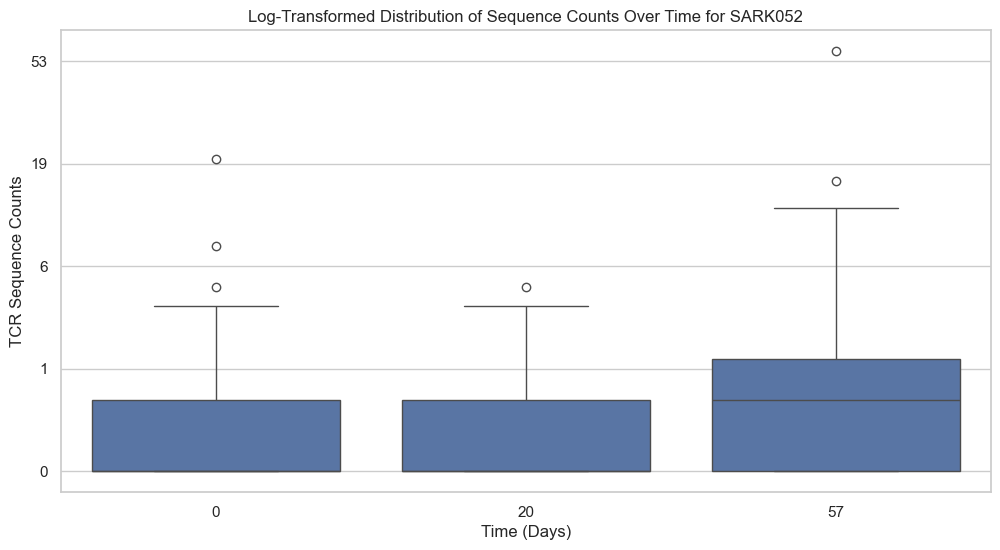

C:\Users\viola\AppData\Local\Temp\ipykernel_2304\3073029521.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale


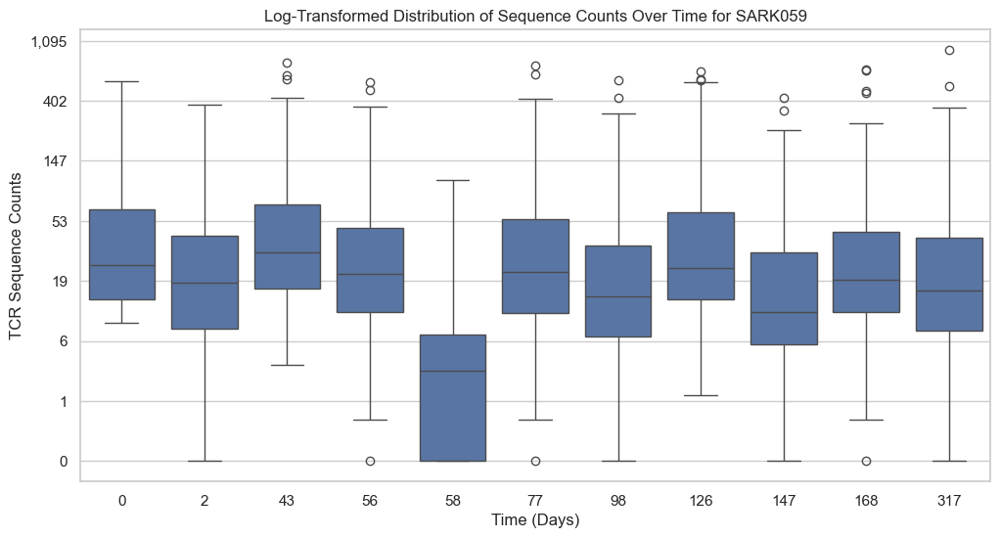

In [42]:
for pat, df in all_df.items():
    if df.empty:
        print(f"Skipping {pat} due to empty dataframe.")
        continue

    # Ensure time is treated as categorical for ordering
    df['time'] = pd.Categorical(df['time'], ordered=True)

    # Apply log transformation to counts
    df['log_counts'] = np.log1p(df['counts'])  # log1p avoids issues with zero values

    # Create figure
    plt.figure(figsize=(12, 6))
    ax = sns.boxplot(x='time', y='log_counts', data=df)

    # Convert y-axis tick labels back to original scale
    yticks = ax.get_yticks()
    ax.set_yticklabels([f"{int(np.expm1(y)):,}" for y in yticks])  # Convert back to original scale

    # Formatting
    plt.xticks()
    plt.xlabel("Time (Days)")
    plt.ylabel("TCR Sequence Counts")
    plt.title(f"Log-Transformed Distribution of Sequence Counts Over Time for {pat}")

    plt.show()
